In [1]:
import anndata as ad
import pandas as pd
import scanpy as sc
from pathlib import Path
import os
import sklearn
import scipy
import numpy as np
import sceleto2 as scl
import pickle
import glob
import os
import scrublet as scr
import matplotlib.pyplot as plt


sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(5,5))
sc.settings.figdir = "./figures"
sc.settings.autosave = False
random_seed = 0

from datetime import date
TODAY = date.today()
print(TODAY)

/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2026-09-10


# 1. QC

In [10]:
del adata

In [11]:
#adata = sc.read_h5ad("/home/neuro_demo_research/repo/epilepsy_microglia_repo/notebooks/epilepsy_microglia/data/processed/galvao/galvao.h5ad")
adata = sc.read_h5ad("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao.h5ad")
adata

AnnData object with n_obs × n_vars = 106290 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_t

In [12]:
adata.var

,source_gene_id,gene_symbol,feature_type,chromosome,source_start,source_end,cellxgene_feature_name,cellxgene_feature_reference,cellxgene_feature_biotype,cellxgene_feature_length,cellxgene_feature_type
gene_name,,,,,,,,,,,
MIR1302-2HG,ENSG00000243485,MIR1302-2HG,Gene Expression,chr1,29553,30267,MIR1302-2HG,NCBITaxon:9606,gene,517,lncRNA
FAM138A,ENSG00000237613,FAM138A,Gene Expression,chr1,36080,36081,FAM138A,NCBITaxon:9606,gene,1015,lncRNA
OR4F5,ENSG00000186092,OR4F5,Gene Expression,chr1,65418,69055,OR4F5,NCBITaxon:9606,gene,2618,protein_coding
AL627309.1,ENSG00000238009,AL627309.1,Gene Expression,chr1,120931,133723,NaN,NaN,NaN,NaN,NaN
AL627309.3,ENSG00000239945,AL627309.3,Gene Expression,chr1,91104,91105,ENSG00000239945,NCBITaxon:9606,gene,1319,lncRNA
...,...,...,...,...,...,...,...,...,...,...,...
AC141272.1,ENSG00000277836,AC141272.1,Gene Expression,KI270728.1,1270983,1270984,ENSG00000277836,NCBITaxon:9606,gene,288,protein_coding
AC023491.2,ENSG00000278633,AC023491.2,Gene Expression,KI270731.1,13000,13001,ENSG00000278633,NCBITaxon:9606,gene,2404,protein_coding
AC007325.1,ENSG00000276017,AC007325.1,Gene Expression,KI270734.1,72410,72411,ENSG00000276017,NCBITaxon:9606,gene,2404,protein_coding


In [13]:
adata.var_names_make_unique()

adata.var["mt"] = adata.var['gene_symbol'].str.upper().str.startswith("MT-")
adata.var["ribo"] = adata.var['gene_symbol'].str.upper().str.startswith(("RPS", "RPL"))
adata.var["hb"] = adata.var['gene_symbol'].str.upper().str.startswith(
    ("HBA", "HBB", "HBD", "HBE", "HBG", "HBM", "HBQ", "HBZ")
)

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt", "ribo", "hb"],
    inplace=True,
    percent_top=[20],
    log1p=True,
)

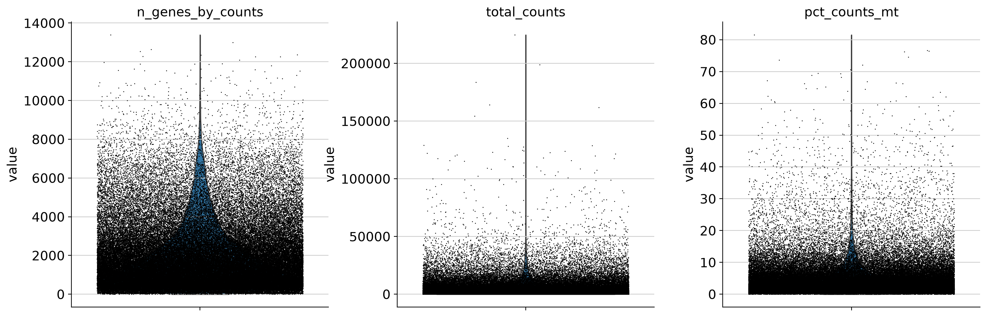

In [6]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

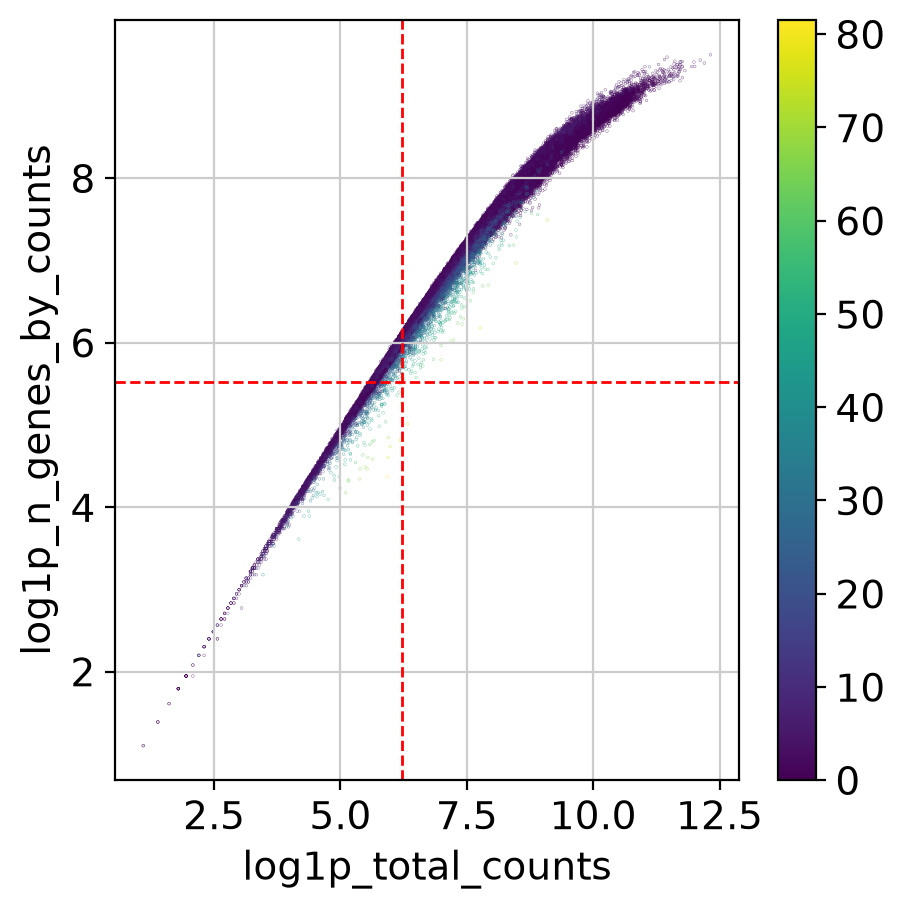

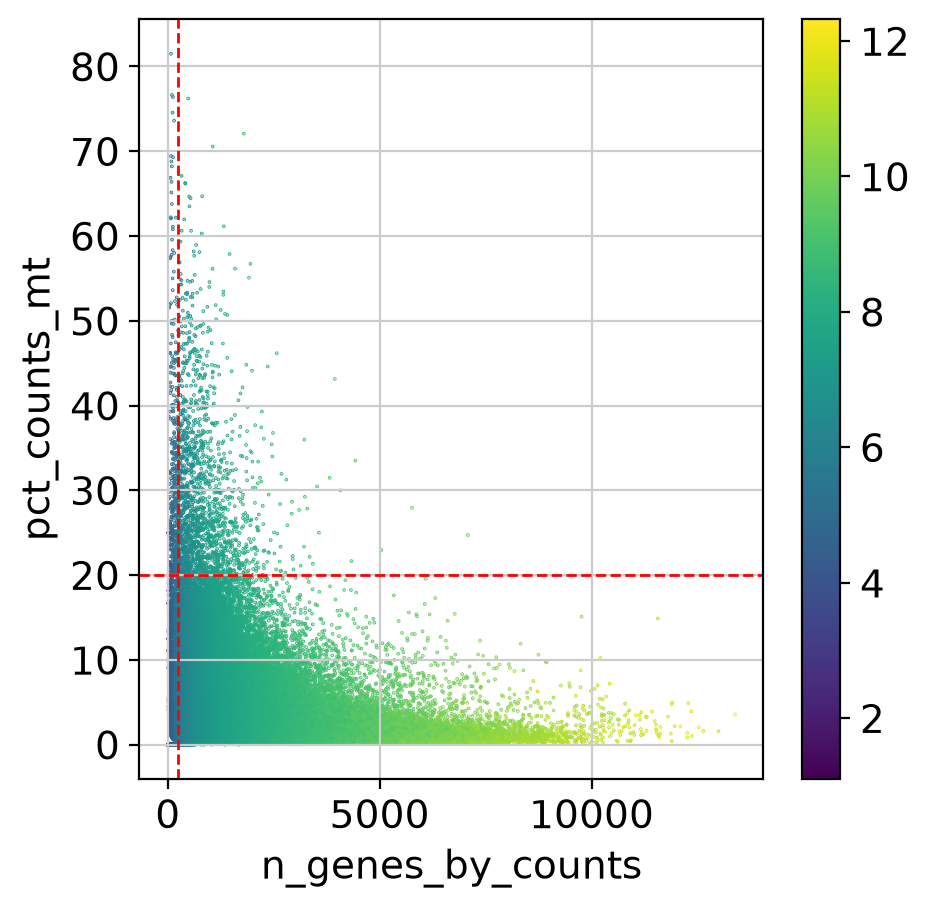

In [16]:
plt.scatter(adata.obs['log1p_total_counts'], adata.obs['log1p_n_genes_by_counts'], c=adata.obs['pct_counts_mt'], s=0.01)
plt.axvline(x=np.log1p(500), color='r', linestyle='--', linewidth=1) # min_counts
plt.axhline(y=np.log1p(250), color='r', linestyle='--', linewidth=1) # min_genes
#plt.axhline(y=np.log1p(7000), color='r', linestyle='--', linewidth=1) # max_genes
plt.xlabel('log1p_total_counts')
plt.ylabel('log1p_n_genes_by_counts')
plt.colorbar()
plt.show()

plt.scatter(adata.obs['n_genes_by_counts'], adata.obs['pct_counts_mt'], c=adata.obs['log1p_total_counts'], s=0.1)
plt.axvline(x=250, color='r', linestyle='--', linewidth=1) # min_genes
#plt.axvline(x=7000, color='r', linestyle='--', linewidth=1) # max_genes
plt.axhline(y=20, color='r', linestyle='--', linewidth=1) # max_mt
plt.xlabel('n_genes_by_counts')
plt.ylabel('pct_counts_mt')
plt.colorbar()
plt.show()

,sample_id,donor_id,total_counts,n_genes_by_counts
cell_id,,,,
G120_D.3:AAACAGCCAATCTCTC-1,G120_D.3,G120,714,531
G120_D.3:AAACAGCCACTGACCG-1,G120_D.3,G120,3772,2092
G120_D.3:AAACAGCCAGGCCTTG-1,G120_D.3,G120,2704,1627
G120_D.3:AAACAGCCAGTTGCGT-1,G120_D.3,G120,2024,1430
G120_D.3:AAACAGCCATAAACCT-1,G120_D.3,G120,58950,9046


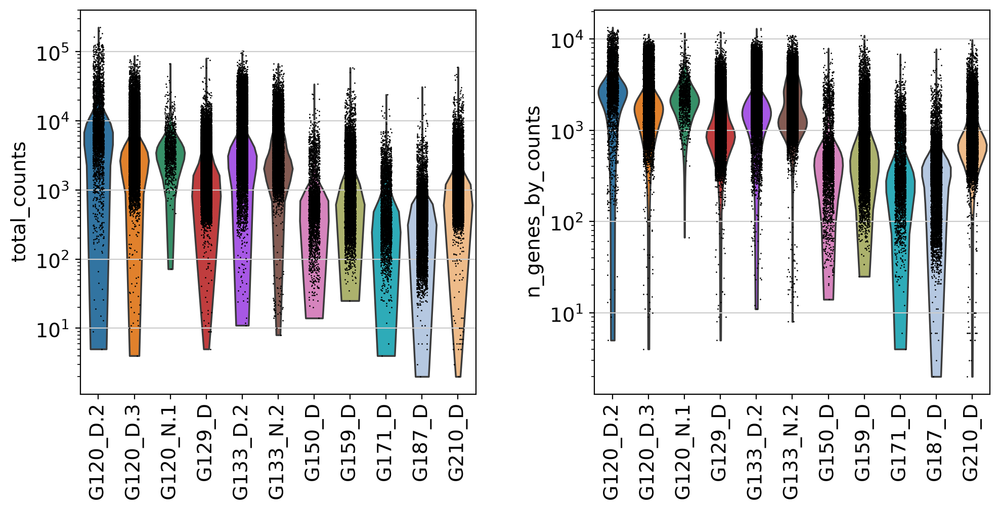

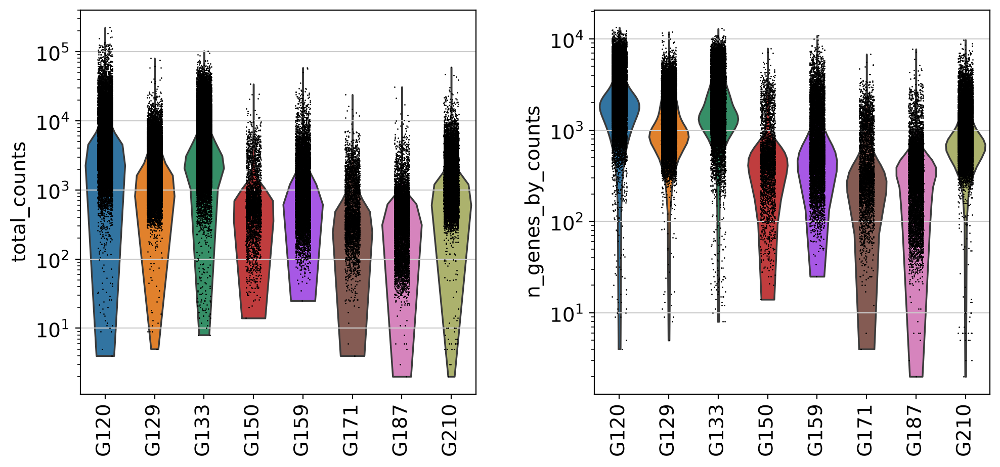

In [14]:
# check donor/sample-level qc metrics

import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Use the raw-count layer if present; otherwise use adata.X.
count_layer = "counts" if "counts" in adata.layers else None

sc.pp.calculate_qc_metrics(
    adata,
    layer=count_layer,
    inplace=True,
    log1p=False,
)

# Confirm these exist before plotting.
display(
    adata.obs[
        ["sample_id", "donor_id", "total_counts", "n_genes_by_counts"]
    ].head()
)

for groupby in ["sample_id", "donor_id"]:
    if groupby not in adata.obs.columns:
        print(f"Skipping {groupby}: column not found.")
        continue

    sc.pl.violin(
        adata,
        keys=["total_counts", "n_genes_by_counts"],
        groupby=groupby,
        layer=count_layer,
        log=True,          # easier to see the low-count nuclear tail
        jitter=0.15,
        rotation=90,
        multi_panel=True,
        show=True,
    )

In [17]:
cutoffs = pd.DataFrame(
    {
        "counts≥500": adata.obs["total_counts"] >= 500,
        "counts≥1000": adata.obs["total_counts"] >= 1000,
        "genes≥250": adata.obs["n_genes_by_counts"] >= 250,
        "genes≥500": adata.obs["n_genes_by_counts"] >= 500,
    },
    index=adata.obs_names,
)

retention_by_sample = (
    cutoffs
    .join(adata.obs["sample_id"])
    .groupby("sample_id", observed=True)
    .mean()
    .mul(100)
    .round(1)
)

display(retention_by_sample)

,counts≥500,counts≥1000,genes≥250,genes≥500
sample_id,,,,
G120_D.2,97.6,95.6,98.2,96.7
G120_D.3,99.3,95.4,99.7,98.5
G120_N.1,99.8,98.7,99.9,99.7
G129_D,96.7,79.2,99.6,95.2
G133_D.2,97.9,94.3,99.3,96.7
G133_N.2,99.7,98.1,99.7,99.4
G150_D,63.0,25.0,82.2,48.0
G159_D,73.0,45.7,88.5,64.3
G171_D,44.6,28.7,69.6,39.2


In [19]:
# doublet detection

scrub = scr.Scrublet(adata.X)
scores, predicted = scrub.scrub_doublets(verbose=False)

adata.obs["doublet_scores"] = scores
adata.obs["predicted_doublets"] = predicted

print(adata.obs["predicted_doublets"].value_counts())

/tmp/ipykernel_2675412/4165740821.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["doublet_scores"] = scores


predicted_doublets
False    91862
True        46
Name: count, dtype: int64


In [18]:
sc.pp.filter_cells(adata, min_counts=500) # 500 이하의 cell 을 가진 Sample 제외
sc.pp.filter_cells(adata, min_genes=250) # 250 이하의 gene 을 가진 Sample 제외
#sc.pp.filter_cells(adata, max_genes=7000) # 7000개 이상의 gene 을 가진 Sample 제외
adata = adata[adata.obs['pct_counts_mt'] < 20, :] # 20% 이상의 mitochondria 분율을 가진 Sample 제외 (doublet 일 수 있음)

filtered out 12836 cells that have less than 500 counts
filtered out 1 cells that have less than 250 genes expressed


In [20]:
adata = adata[~adata.obs["predicted_doublets"]].copy()

In [21]:
adata

AnnData object with n_obs × n_vars = 91862 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_ti

In [23]:
adata.write("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")

# 2. Preprocess

In [24]:
adata = sc.read_h5ad("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")
adata

AnnData object with n_obs × n_vars = 91862 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_ti

In [25]:
print(adata.layers['counts'].max())
print(adata.layers['counts'].min())

4810
0


In [26]:
# normalization

print('before log1p norm')
print('max: ', np.max(adata.X))
print('min: ', np.min(adata.X))
print('mean: ', np.mean(adata.X))

adata.var_names_make_unique()
adata.obs_names_make_unique()

# Normalization : Sample 에서 세포 합이 모두 100,00 이 되도록 함 (Sample 간의 비교를 위해)
sc.pp.normalize_total(adata, target_sum=1e4)

# Matrix 가 잘 정규화 되었는지 확인
adata.X.sum(axis=1)

# Logarithmize
sc.pp.log1p(adata)
adata.raw = adata
print('after log1p norm')
print('max: ', np.max(adata.X))
print('min: ', np.min(adata.X))
print('mean: ', np.mean(adata.X))

before log1p norm
max:  4810
min:  0
mean:  0.14282971004891024
normalizing counts per cell
    finished (0:00:02)
after log1p norm
max:  7.907048
min:  0.0
mean:  0.08134401


extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


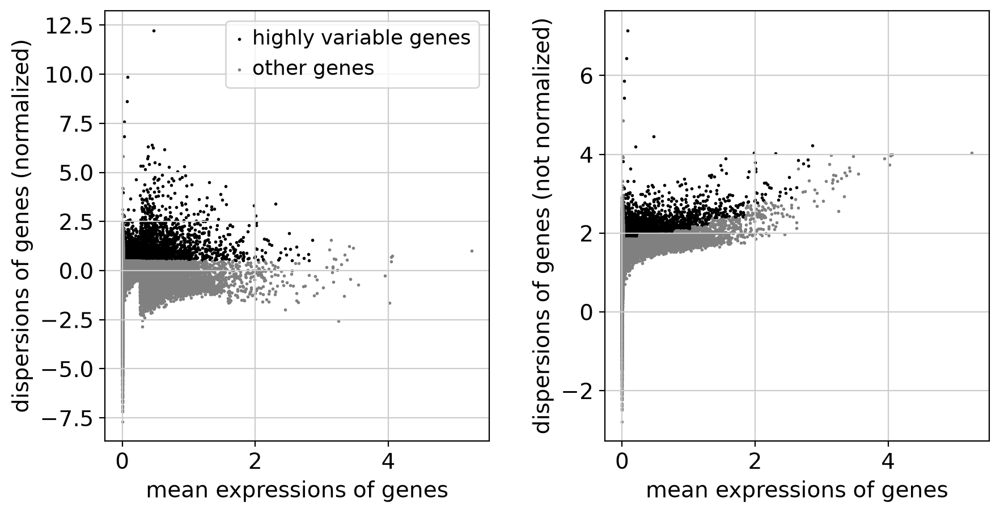

detected 6459 highly variable genes


/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


In [27]:
# HVG (Highly variable genes) : adata 에서 어떤 Gene 들이 많이 차이가 나는지 확인
sc.pp.highly_variable_genes(adata) # adata 에서 HVG 에 해당하는 Gene 갯수를 확인
sc.pl.highly_variable_genes(adata)
print(f"detected {np.sum(adata.var['highly_variable'])} highly variable genes")

sc.pp.scale(adata, max_value=10)

In [28]:
adata.write("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")

# 3. Feature Selecetion

computing PCA
    with n_comps=50
    finished (0:00:45)


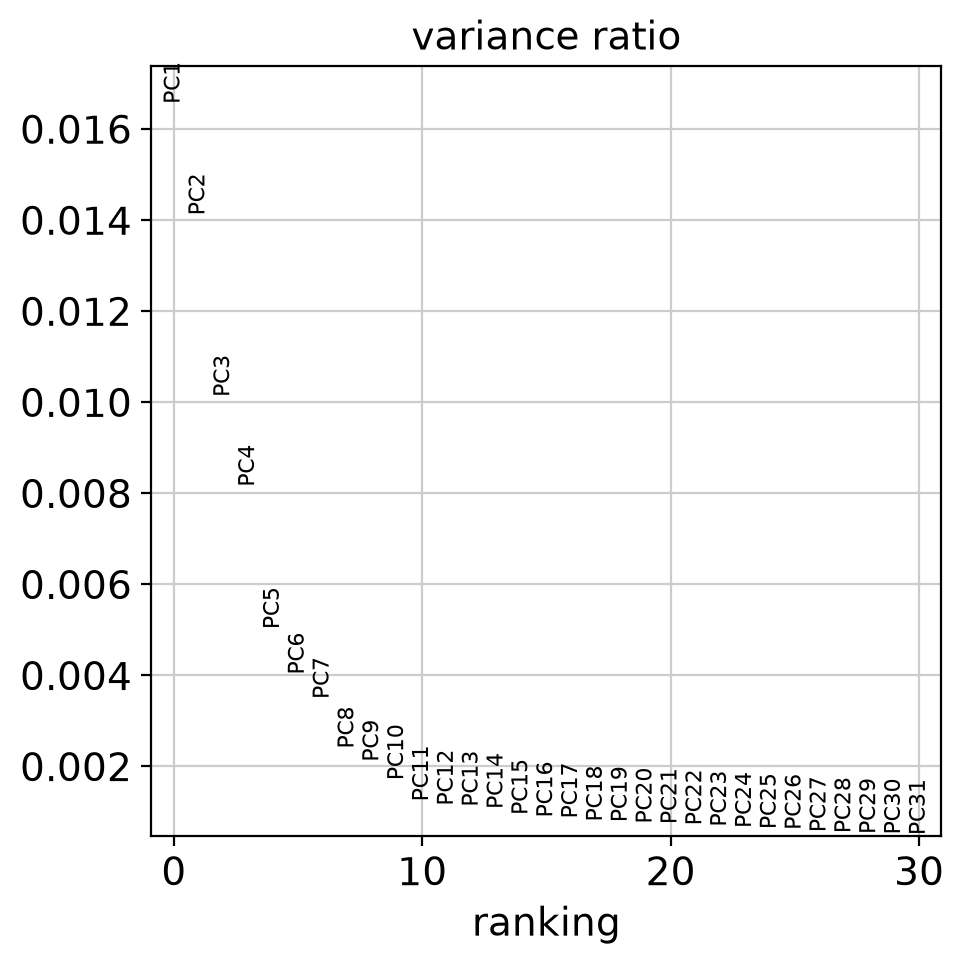

In [29]:
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata)

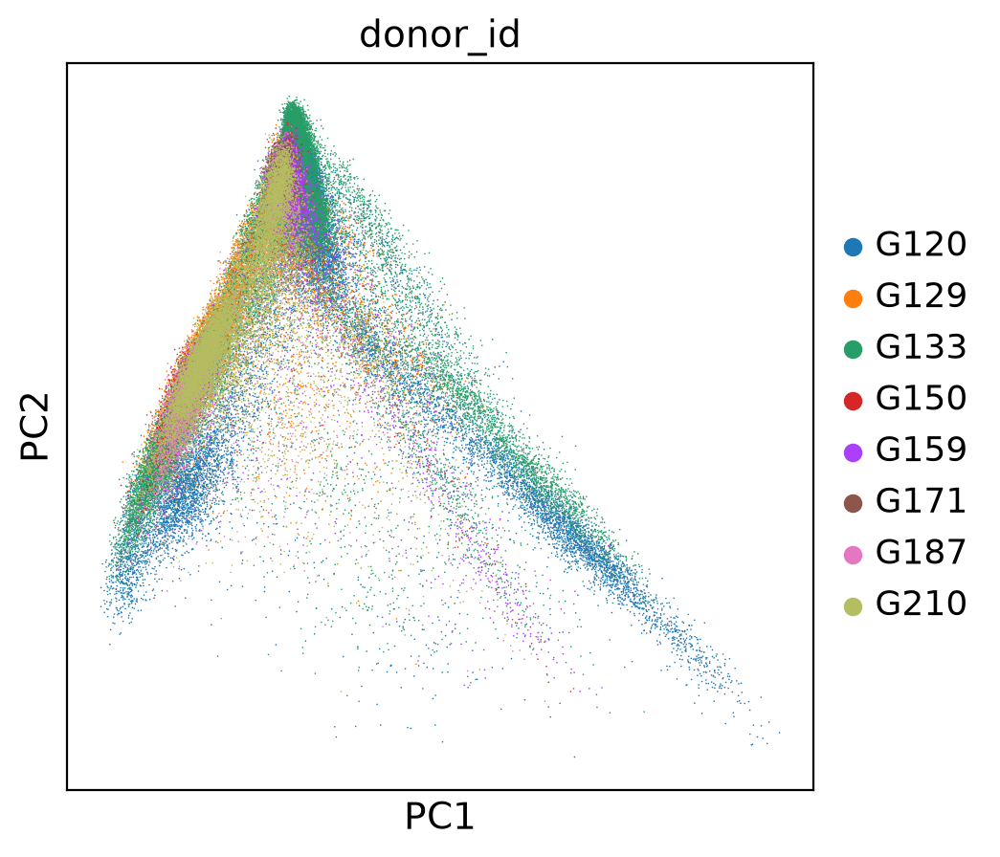

In [33]:
sc.pl.pca(adata, color = 'donor_id')

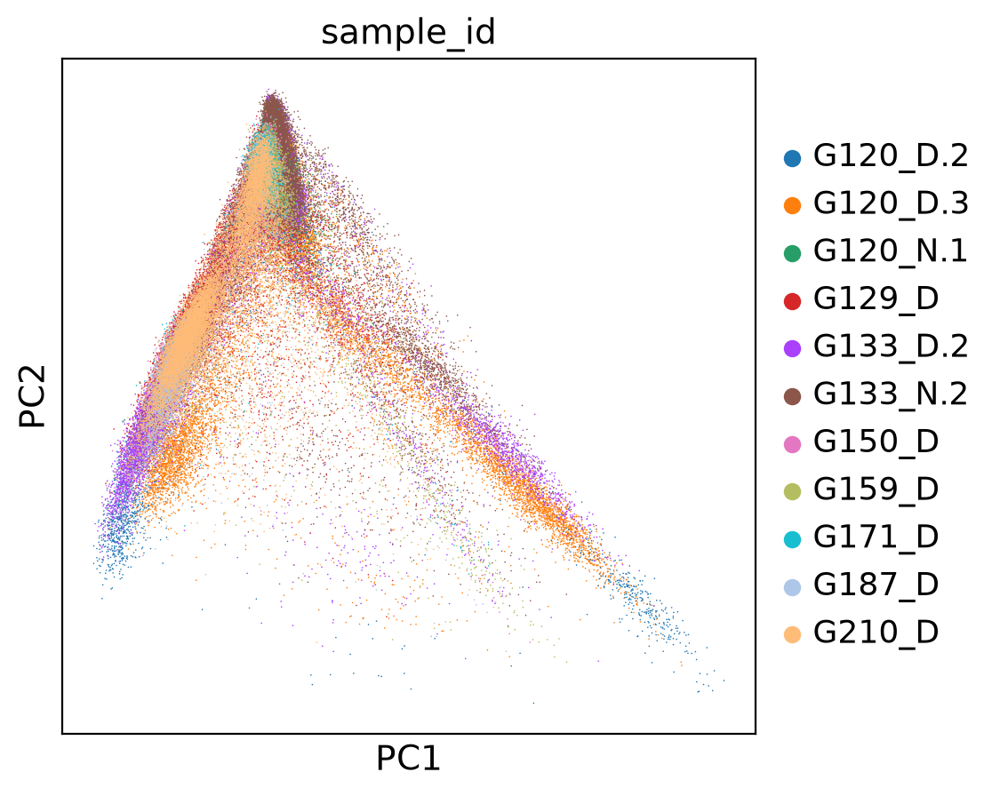

In [34]:
sc.pl.pca(adata, color = 'sample_id')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:35)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:50)


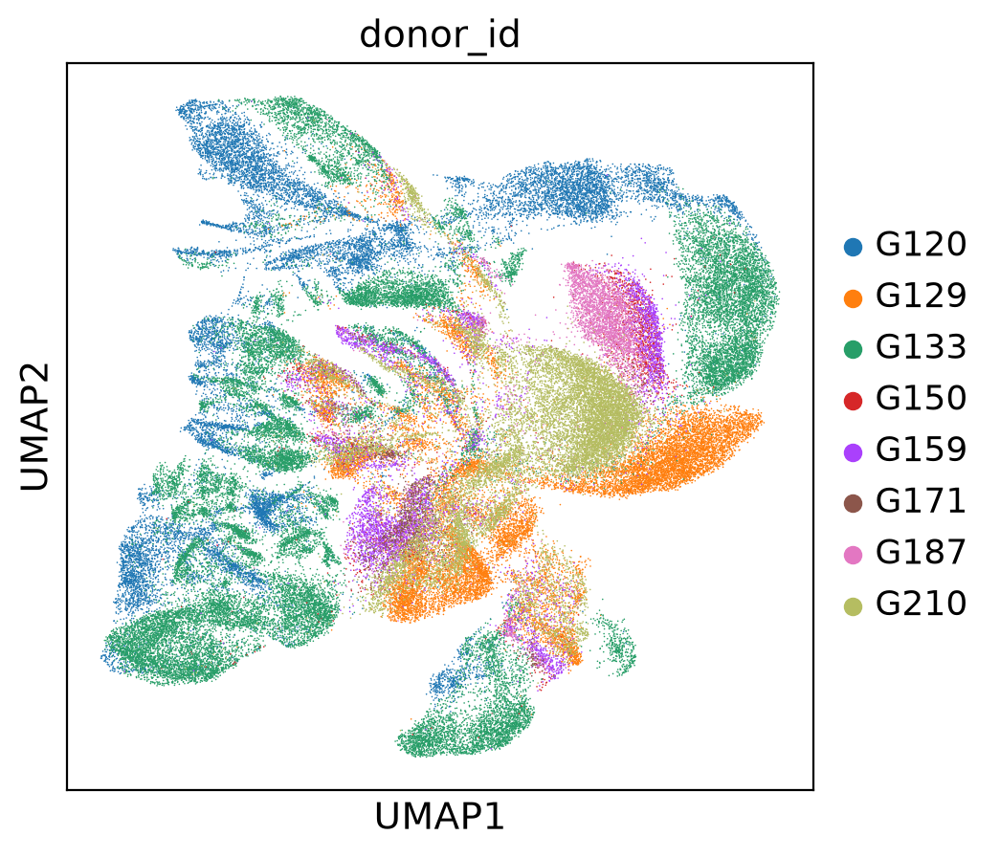

In [35]:
# without batch correction

sc.pp.neighbors(adata, use_rep = 'X_pca', n_pcs = 20)
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'donor_id', save=f"_{TODAY}_xharmony_npcs=20.png")

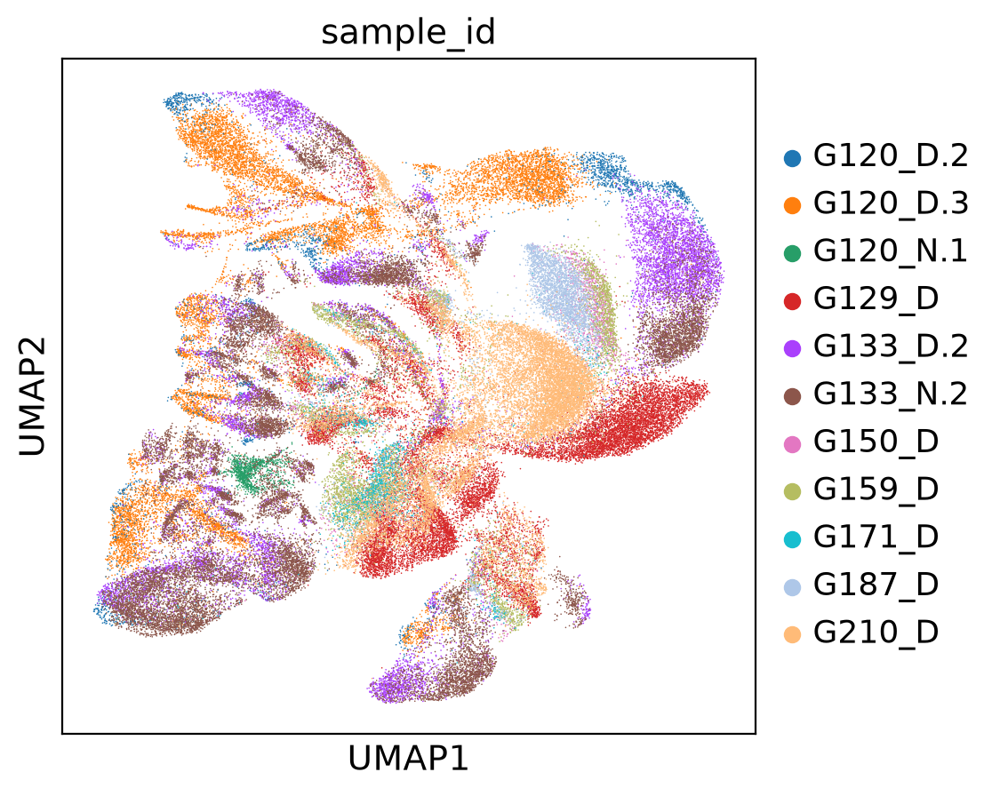

In [36]:
sc.pl.umap(adata, color = 'sample_id', save=f"_{TODAY}_sample_xharmony_npcs=20.png")

In [37]:
import harmonypy as hm

ho = hm.run_harmony(
    adata.obsm["X_pca"].astype(np.float64),
    adata.obs,
    "sample_id",
    max_iter_harmony=50
)

print(ho.Z_corr.shape)
adata.obsm["X_pca_harmony"] = np.asarray(ho.Z_corr)

2026-09-10 11:04:40,898 - harmonypy - INFO - Running Harmony
2026-09-10 11:04:40,899 - harmonypy - INFO -   Parameters:
2026-09-10 11:04:40,900 - harmonypy - INFO -     max_iter_harmony: 50
2026-09-10 11:04:40,900 - harmonypy - INFO -     max_iter_kmeans: 4
2026-09-10 11:04:40,901 - harmonypy - INFO -     epsilon_cluster: 0.001
2026-09-10 11:04:40,903 - harmonypy - INFO -     epsilon_harmony: 0.01
2026-09-10 11:04:40,903 - harmonypy - INFO -     nclust: 100
2026-09-10 11:04:40,904 - harmonypy - INFO -     block_size: 0.05
2026-09-10 11:04:40,905 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
2026-09-10 11:04:40,906 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-09-10 11:04:40,907 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-09-10 11:04:40,908 - harmonypy - INFO -     verbose: True
2026-09-10 11:04:40,909 - harmonypy - INFO -     random_state: 0
2026-09-10 11:04:40,909 - harmonypy - INFO -   Data: 50 PCs × 91862 cells
2026-09-10 11:04:40,910

(91862, 50)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:53)


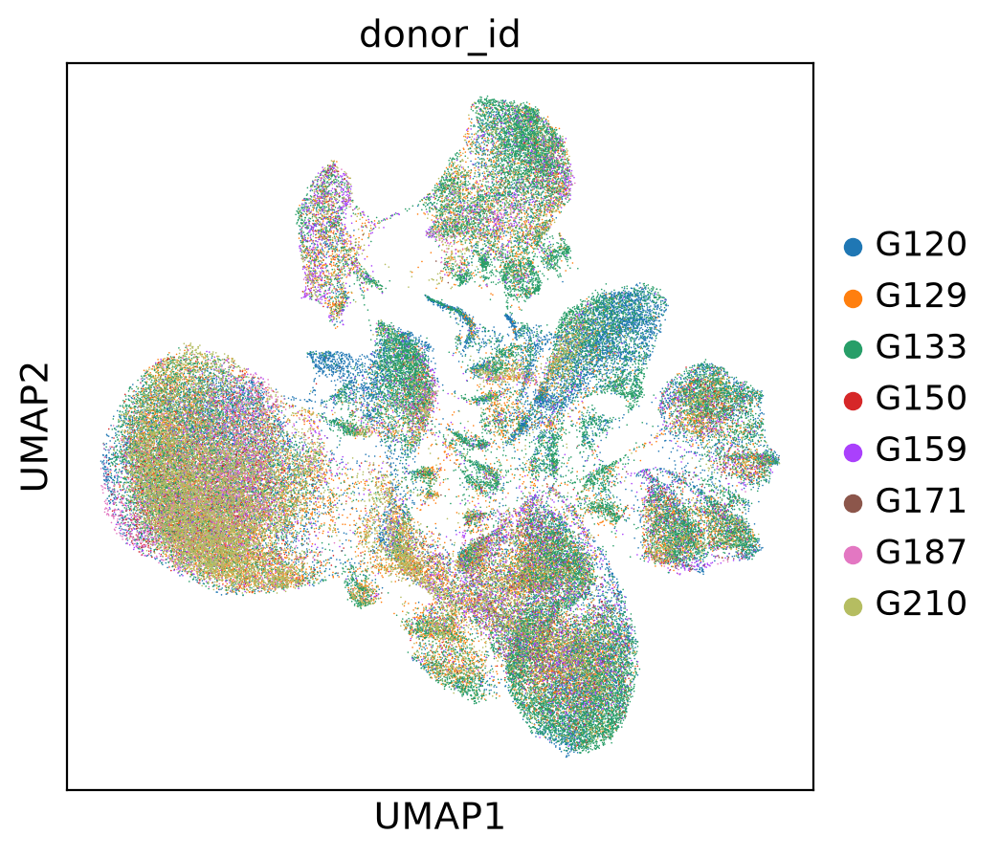

In [38]:
# with batch correction

sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_pcs = 20)
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'donor_id', save=f"_{TODAY}_donor_harmony_npcs=20.png")

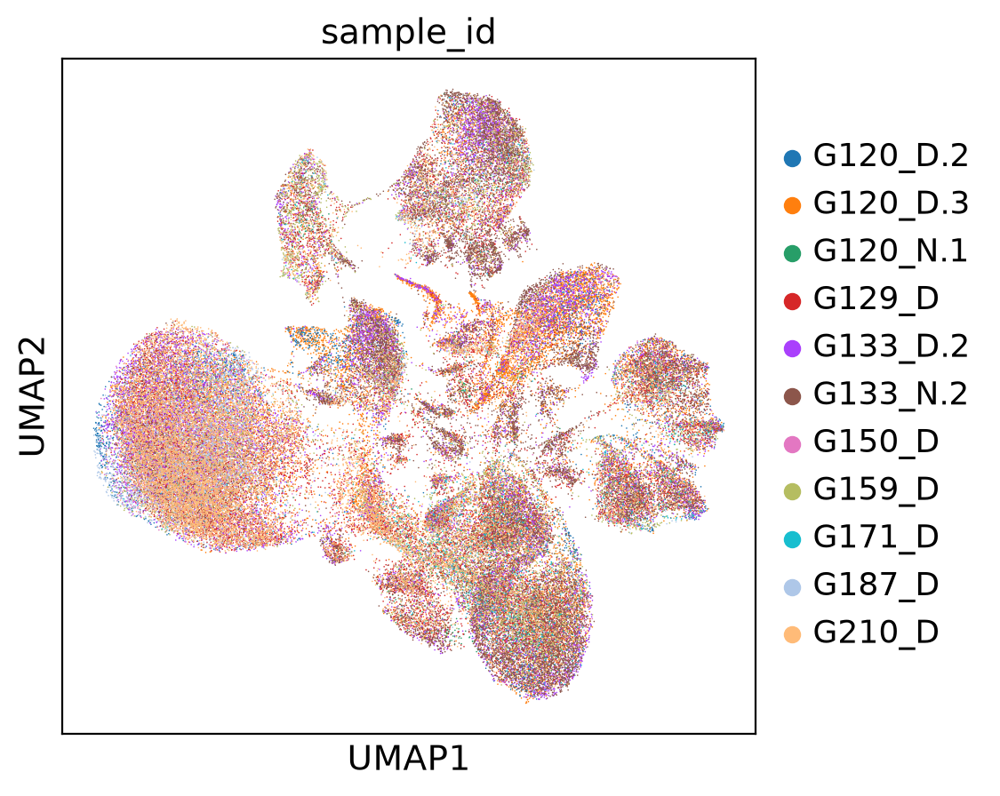

In [39]:
sc.pl.umap(adata, color = 'sample_id', save=f"_{TODAY}_sample_harmony_npcs=20.png")

# 4. Clustering

In [41]:
sc.tl.leiden(adata, resolution = 0.5, key_added='leiden_05')
sc.tl.leiden(adata, resolution = 1.0, key_added='leiden_10')

running Leiden clustering


/tmp/ipykernel_2675412/4008177221.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution = 0.5, key_added='leiden_05')


    finished: found 18 clusters and added
    'leiden_05', the cluster labels (adata.obs, categorical) (0:03:07)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden_10', the cluster labels (adata.obs, categorical) (0:06:33)


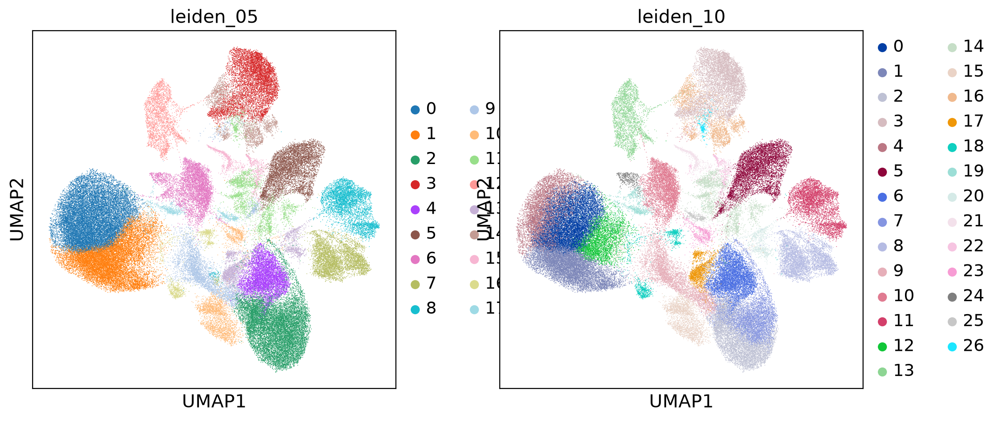

In [42]:
scl.us(adata, 'leiden_05,leiden_10')

In [43]:
sc.tl.rank_genes_groups(adata, groupby='leiden_05', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:57)


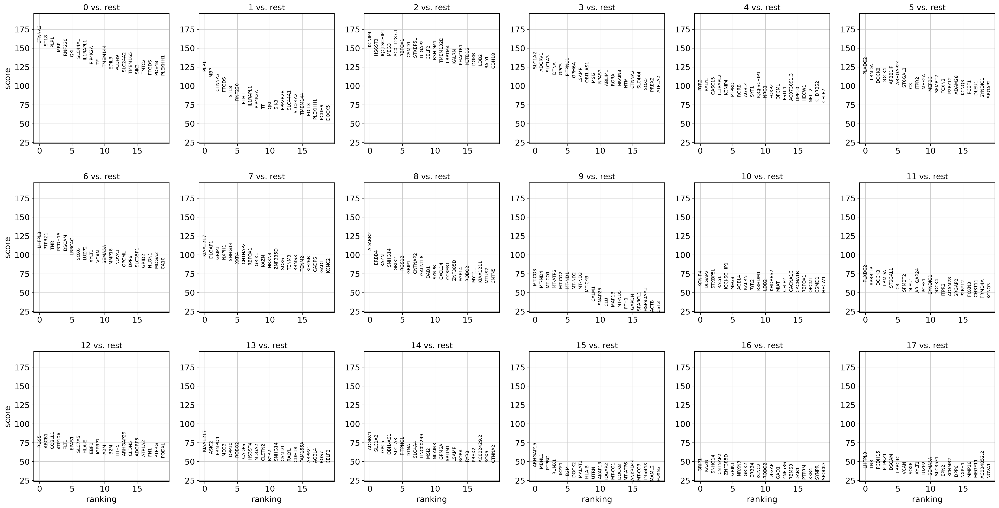

In [44]:
sc.pl.rank_genes_groups(adata, ncols = 6)

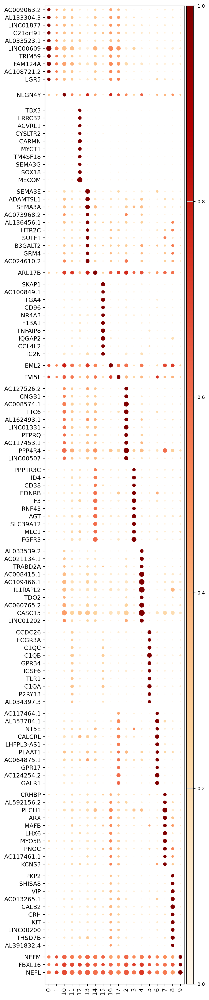

{np.str_('0'): ['AC009063.2',
  'AL133304.3',
  'LINC01877',
  'C21orf91',
  'AL033523.1',
  'LINC00609',
  'TRIM59',
  'FAM124A',
  'AC108721.2',
  'LGR5'],
 np.str_('1'): [],
 np.str_('10'): ['NLGN4Y'],
 np.str_('11'): [],
 np.str_('12'): ['TBX3',
  'LRRC32',
  'ACVRL1',
  'CYSLTR2',
  'CARMN',
  'MYCT1',
  'TM4SF18',
  'SEMA3G',
  'SOX18',
  'MECOM'],
 np.str_('13'): ['SEMA3E',
  'ADAMTSL1',
  'SEMA3A',
  'AC073968.2',
  'AL136456.1',
  'HTR2C',
  'SULF1',
  'B3GALT2',
  'GRM4',
  'AC024610.2'],
 np.str_('14'): ['ARL17B'],
 np.str_('15'): ['SKAP1',
  'AC100849.1',
  'ITGA4',
  'CD96',
  'NR4A3',
  'F13A1',
  'TNFAIP8',
  'IQGAP2',
  'CCL4L2',
  'TC2N'],
 np.str_('16'): ['EML2'],
 np.str_('17'): ['EVI5L'],
 np.str_('2'): ['AC127526.2',
  'CNGB1',
  'AC008574.1',
  'TTC6',
  'AL162493.1',
  'LINC01331',
  'PTPRQ',
  'AC117453.1',
  'PPP4R4',
  'LINC00507'],
 np.str_('3'): ['PPP1R3C',
  'ID4',
  'CD38',
  'EDNRB',
  'F3',
  'RNF43',
  'AGT',
  'SLC39A12',
  'MLC1',
  'FGFR3'],
 np.str_

In [45]:
M = scl.markers.marker(adata, 'leiden_05')
M.plot_marker()

In [46]:
adata.write("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")

# 5. Lv.1 Annotation

In [47]:
markers = {
    "Microglia": [
        "P2RY12", "P2RY13", "TMEM119", "CX3CR1",
        "C1QA", "C1QB", "C1QC", "GPR34", "CSF1R"
    ],
    "Macrophage_MDM": [
        "FCGR3A", "LILRB1", "LILRB2", "CTSD",
        "CTSB", "LGALS3", "APOE", "SPP1"
    ],
    "Lymphocyte": [
        "CD3D", "CD3E", "TRBC1", "TRBC2",
        "SKAP1", "CD96", "CCL4", "NKG7"
    ],
    "Astrocyte": [
        "AQP4", "SLC1A2", "SLC1A3", "GFAP", "ALDH1L1"
    ],
    "Oligodendrocyte": [
        "PLP1", "MBP", "MOG", "MAG", "MOBP"
    ],
    "OPC": [
        "PDGFRA", "CSPG4", "VCAN", "OLIG1", "OLIG2"
    ],
    "Endothelial": [
        "CLDN5", "FLT1", "PECAM1", "VWF", "EMCN"
    ],
    "Pericyte": [
        "RGS5", "ABCC9", "PDGFRB", "CSPG4", "MCAM"
    ],
}

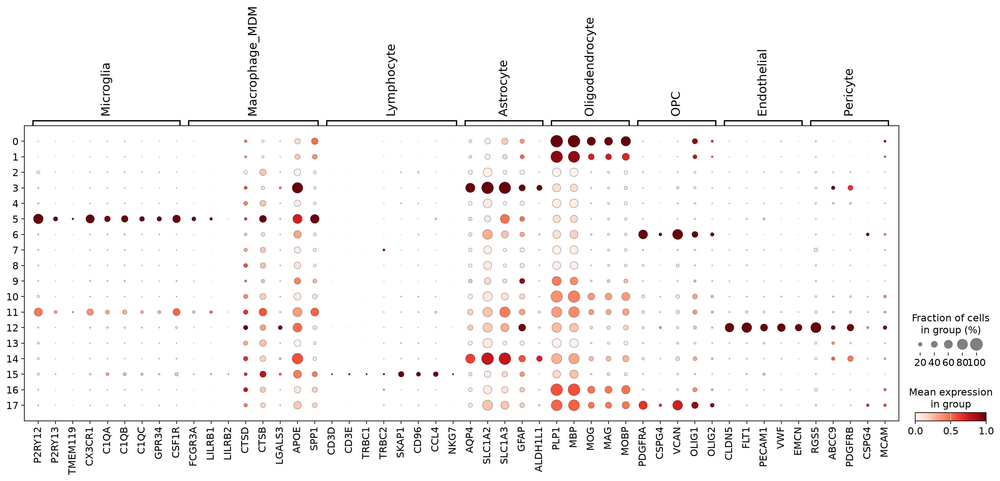

In [48]:
sc.pl.dotplot(
    adata,
    markers,
    groupby="leiden_05",
    standard_scale="var",
    dendrogram=False,
)

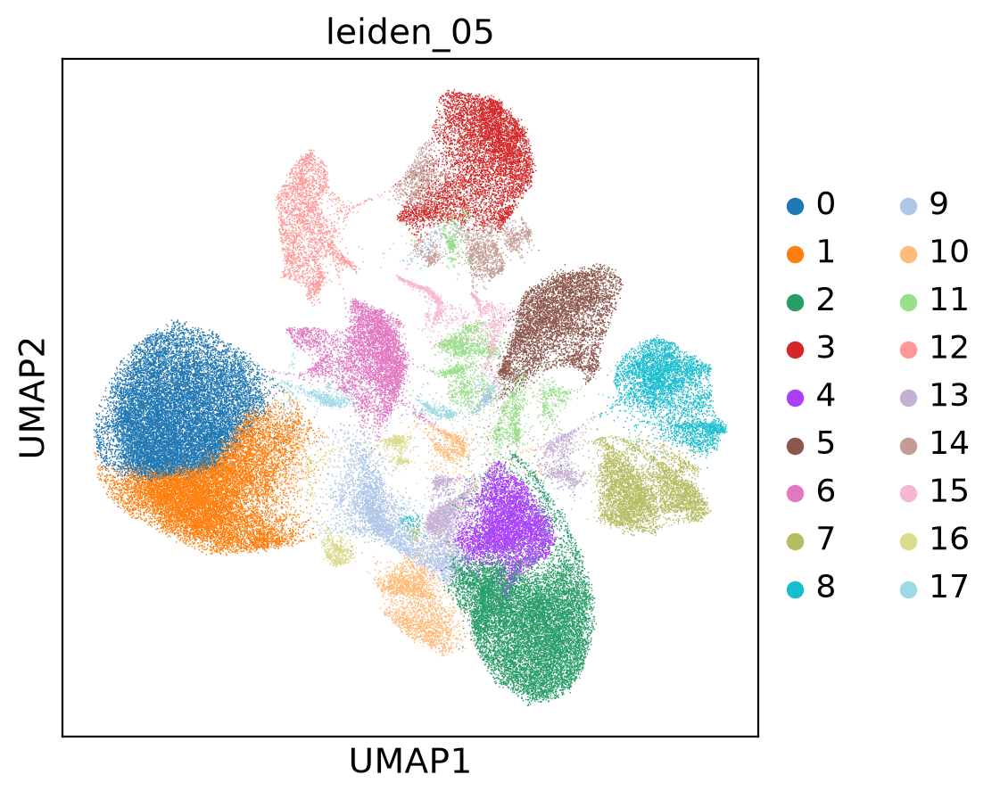

In [49]:
scl.us(adata, 'leiden_05')

In [50]:
lv1_map = {
    "0": "Oligodendrocyte",
    "1": "Oligodendrocyte",
    "2": "Neuron",
    "3": "Astrocyte",
    "4": "Neuron",
    "5": "Microglia",
    "6": "OPC",
    "7": "Neuron",
    "8": "Neuron",
    "9": "lowquality",
    "10": "Neuron",
    "11": "Microglia",
    "12": "Endothelial",
    "13": "Neuron",
    "14": "Astrocyte",
    "15": "Lymphocyte",
    "16": "Neuron",
    "17": "OPC",
}

adata.obs["celltype_lv1"] = (
    adata.obs["leiden_05"]
    .astype(str)
    .map(lv1_map)
    .astype("category")
)

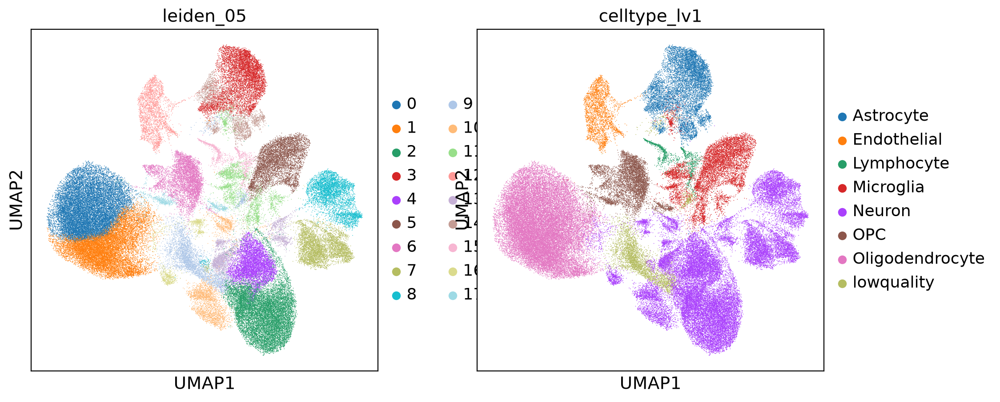

In [51]:
scl.us(adata, 'leiden_05,celltype_lv1')

In [52]:
adata.write("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")

# 6. Microglia Lv. 2 annotation

In [2]:
adata = sc.read_h5ad("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao_qc.h5ad")
print(adata)
mdata = adata[adata.obs['celltype_lv1'] == 'Microglia'].copy()

AnnData object with n_obs × n_vars = 91862 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_ti

In [3]:
mdata

AnnData object with n_obs × n_vars = 8273 × 36601
    obs: 'source_cell_id', 'study', 'donor_id', 'sample_id', 'diagnosis', 'pathology', 'fcd_subtype', 'control_status', 'mutation_status', 'brain_region', 'assay', 'platform', 'source_accession', 'source_sample_id', 'source_file', 'paired_atac_accession', 'source_file_sample_id', 'fcd_type', 'geo_accession', 'geo_source_name', 'geo_tissue', 'geo_donor', 'geo_disease', 'geo_library_type', 'geo_Sex', 'geo_age_at_surgery', 'geo_age_at_onset', 'geo_duration', 'geo_lobe', 'geo_lateralization', 'geo_histological_assessment', 'geo_surgery_reason', 'geo_seq_batch', 'geo_platform_id', 'cellxgene_mapped_reference_annotation', 'cellxgene_donor_id', 'cellxgene_self_reported_ethnicity_ontology_term_id', 'cellxgene_donor_living_at_sample_collection', 'cellxgene_sample_uuid', 'cellxgene_sample_preservation_method', 'cellxgene_tissue_ontology_term_id', 'cellxgene_development_stage_ontology_term_id', 'cellxgene_sample_derivation_process', 'cellxgene_tis

In [4]:
mdata.X = mdata.layers['counts'].copy()
print(mdata.X.max(), mdata.X.min())

2253 0


In [5]:
# preprocess
sc.pp.normalize_total(mdata)
sc.pp.log1p(mdata)
sc.pp.highly_variable_genes(mdata)
sc.pp.scale(mdata)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/lsj1022/anaconda3/envs/scenv/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:20)


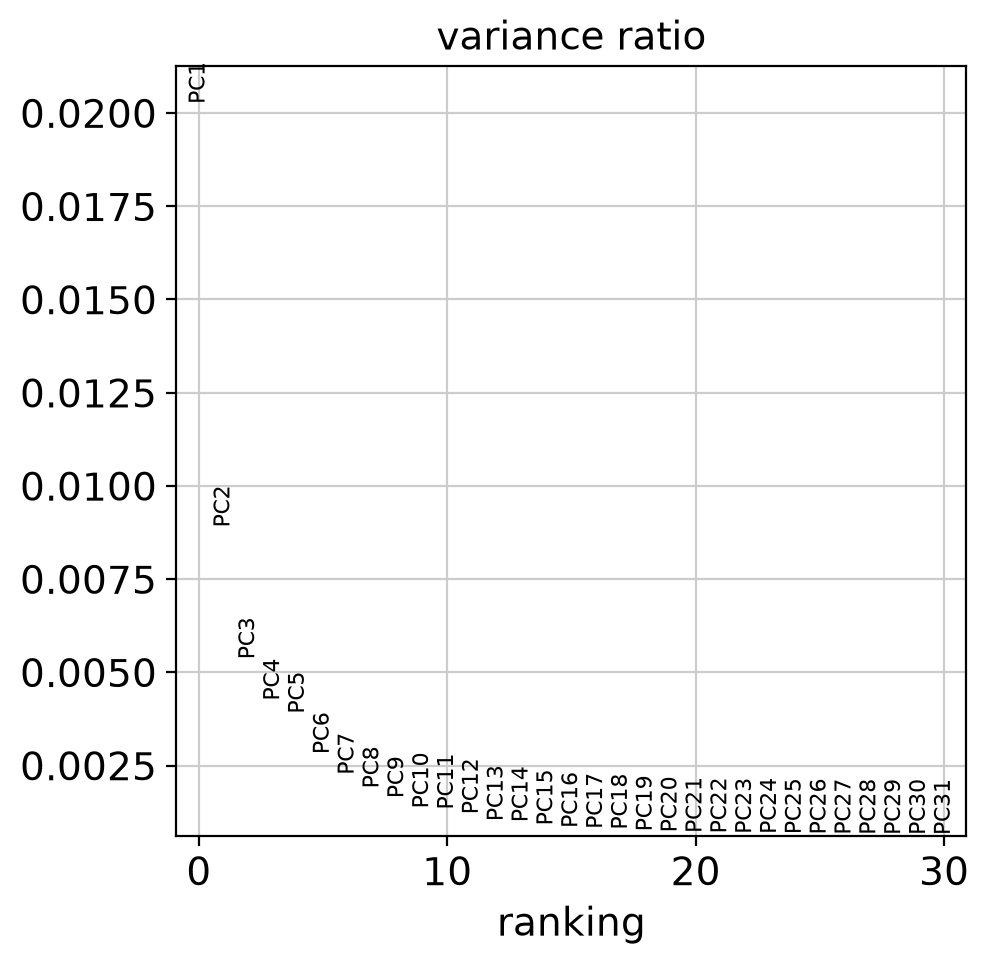

In [7]:
# feature selection
sc.tl.pca(mdata)
sc.pl.pca_variance_ratio(mdata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:28)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:09)


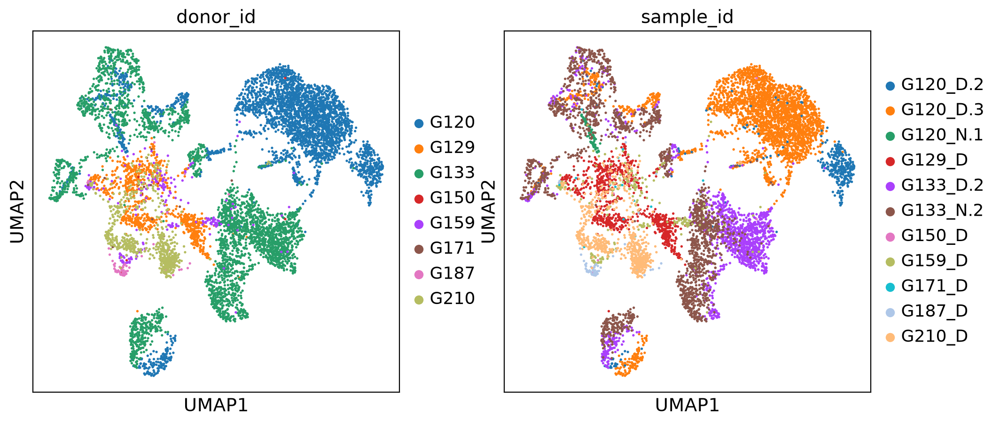

In [8]:
sc.pp.neighbors(mdata, use_rep = 'X_pca', n_pcs=20)
sc.tl.umap(mdata)
scl.us(mdata, 'donor_id,sample_id')

In [9]:
mdata.write("/data/SJLEE/Epilepsy_Microglia/notebooks/epilepsy_microglia/data/processed/galvao/galvao_mg.h5ad")